In [1]:
from dinov2.models import DINOv2

In [2]:
import torch

dinov2 = DINOv2.from_pretrained(
    'KevinCha/dinov2-vit-small-remote-sensing',
    device_map=0,
    torch_dtype=torch.float32,
)
dinov2 = dinov2.eval()

In [3]:
from torchvision import transforms
from PIL import Image

In [4]:
transform1 = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

In [5]:
from glob import glob

In [6]:
import torchvision
dataset = torchvision.datasets.ImageFolder(
    root='../../../../../vl-data/cvbrct/aerial',
    transform=transform1,
)

In [7]:
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=128,
    num_workers=4,
    drop_last=False,
)

In [8]:
from tqdm import tqdm

features = list()
for data in tqdm(dataloader):
    image, _ = data
    image = image.to('cuda')
    with torch.no_grad():
        feature = dinov2.student.backbone(image).x_norm_clstoken.cpu()
    features.append(feature)
features = torch.cat(features)


00%|██████████████████████████████████████████████████████████████| 189/189 [01:38<00:00,  1.91it/s]

In [9]:
import faiss

In [10]:
numpy_features = features.numpy()
index = faiss.IndexFlatL2(numpy_features.shape[-1])
index.add(numpy_features)

In [11]:
import numpy as np
idx = np.random.choice(len(features))
search_dist, search_idx = index.search(np.array([numpy_features[idx]]), k=20)

In [12]:
search_filenames = [dataset.imgs[i][0] for i in search_idx[0]]
print(len(search_filenames))

20



00%|████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 71.70it/s]

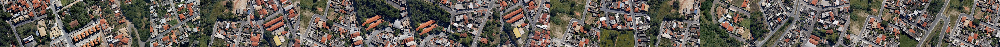

In [13]:
from PIL import Image
from IPython.display import display
from tqdm import tqdm

cat = list()
for filename in tqdm(search_filenames):
    pil_image = Image.open(filename)
    image = np.array(pil_image)
    pil_image.close()
    cat.append(image)
cat = np.concatenate(cat, axis=1)
cat = Image.fromarray(cat)
display(cat)